# Dog Breed Classifier

This project uses deep learning and neural networks (TensorFlow) to create an image classifier which predicts dog breeds.

## 1. Problem
Identifying dog breeds based off of images using Transfer Learning.

## 2. Data
The data was from Kaggle's dog breed identification competition ([kaggle.com/c/dog-breed-identification](https://kaggle.com/c/dog-breed-identification))

## 3. Evaluation
The model is evaluated based off of the Multi Class Log Loss (MCLL) on the model's predictive probabilities on the test data. The lower the MCLL, the better the model. More information can be found in the Kaggle Evaluation section.
https://kaggle.com/c/dog-breed-identification/overview/evaluation

I will also evaluate the model on accuracy.

## 4. Features
This project involves unstructured data (images) and therefore deep learning will be used.
* There are 120 breeds of dogs, with over 10,000+ images in both the test and train sets
* The training images have labels while the test don't

In [4]:
# Getting data
import os
os.chdir("/content/")
 
!pwd
!git clone https://github.com/daniyal-d/Dog-Breed-Recognition
os.chdir("/content/")

/content
Cloning into 'Dog-Breed-Recognition'...
remote: Enumerating objects: 20595, done.
remote: Counting objects: 100% (101/101), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 20595 (delta 28), reused 97 (delta 27), pack-reused 20494
Receiving objects: 100% (20595/20595), 784.22 MiB | 36.51 MiB/s, done.
Resolving deltas: 100% (28/28), done.
Checking out files: 100% (20598/20598), done.


In [226]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import tensorflow as tf
import tensorflow_hub as hub

if tf.config.list_physical_devices("GPU"):
  print("GPU working")
else:
  print("GPU not working")

GPU working


In [6]:
# Converting images into tensors (converting images into numerical format)
labels_csv = pd.read_csv("/content/Dog-Breed-Recognition/labels.csv")
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


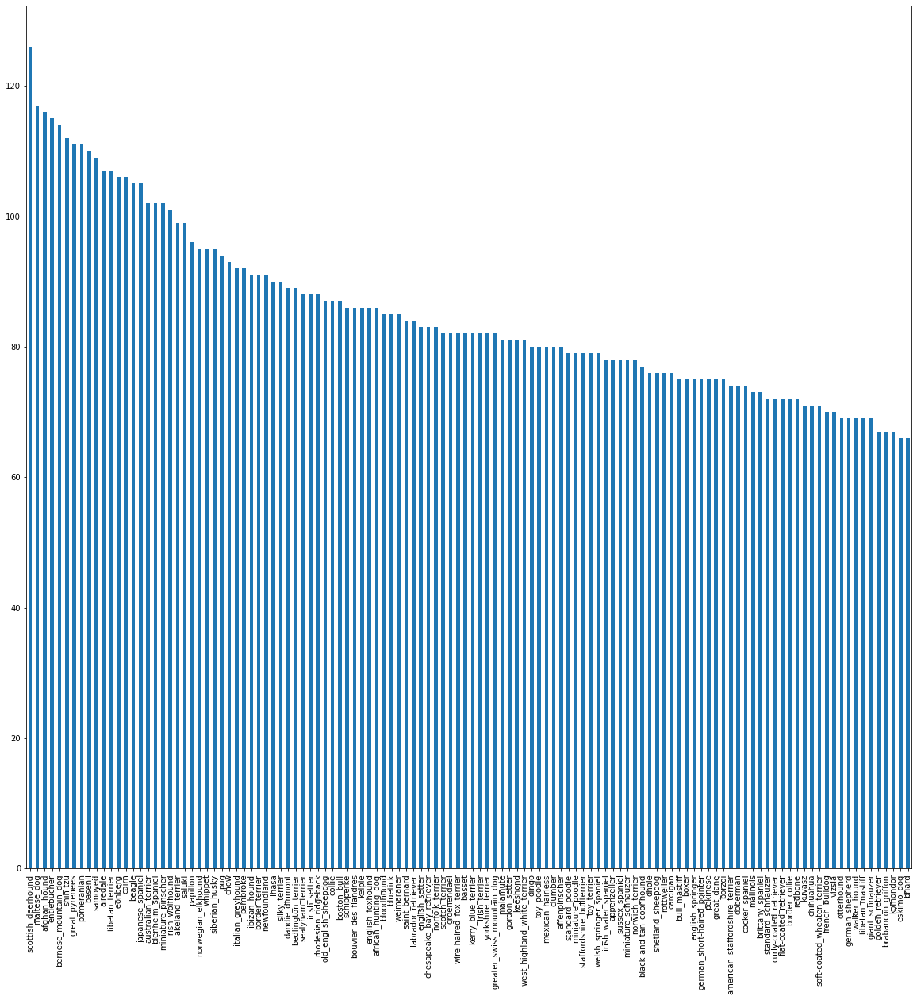

In [8]:
# Getting number of images for each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,20));

In [9]:
labels_csv["breed"].value_counts().median()

82.0

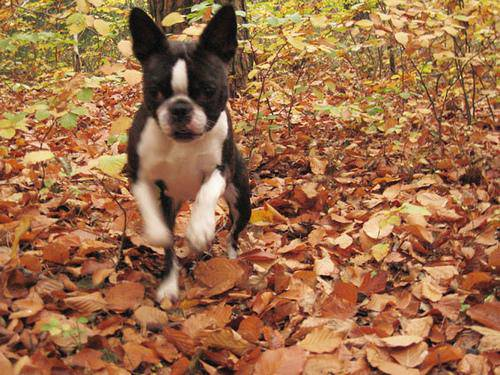

In [10]:
# Viewing image of a dog (Boston Bulldog)
from IPython.display import Image
Image("/content/Dog-Breed-Recognition/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [11]:
# Getting pathnames from image IDs

pathnames = ["/content/Dog-Breed-Recognition/train/" + id + ".jpg" for id in labels_csv["id"]]
len(pathnames), len(labels_csv["id"])

(10222, 10222)

In [12]:
# Encoding dog labels

labels = np.array(labels_csv["breed"])
labels, len(labels)

(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [13]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [14]:
encoded_labels = [label == unique_breeds for label in labels]
encoded_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

### Creating a validation set

In [230]:
X = pathnames
y = encoded_labels

There are 10000 images. Because testing on all of these would take too long, only 1000 will be used.



In [231]:
NUM_IMAGES = 1000 #@param {type:"slider", min:100, max:1000, step:1}

In [232]:
from sklearn.model_selection import train_test_split

np.random.seed(42)
X_train, X_validation, y_train, y_validation = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2)

len(X_train), len(y_train), len(X_validation), len(y_validation)

(800, 800, 200, 200)

In [233]:
# Converting images to Tensors and resizing them

IMG_SIZE = 224

def preprocess_image(path, img_size=IMG_SIZE):
  image = tf.io.read_file(path)

  # Creating RGB values
  image = tf.image.decode_jpeg(image, channels=3)

  # Normalizing RGB values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Converting images into batches

This is done to save memory and speed up training. Rather than have the model train on all images at once, it trains on smaller "batches" of images.

In [234]:
# Converting image path and label to tuple

def get_image_label_tuple(path, label):
  image = preprocess_image(path)
  return image, label

In [235]:
# Creating batches for X and y data
BATCH_SIZE = 32

def create_batch(X, y=None, batch_size=BATCH_SIZE, validation=False, test=False):
  if test:
    print("Test Data")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(preprocess_image).batch(BATCH_SIZE)
    return data_batch
  
  elif validation:
    print("Validation Data")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label_tuple).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print("Training Data")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label_tuple)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [236]:
train_data = create_batch(X_train, y_train)
validation_data = create_batch(X_validation, y_validation, validation=True)

Training Data
Validation Data


In [237]:
train_data.element_spec, validation_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [238]:
# Visualizing the data batches

def show_25_images(images, labels):
  plt.figure(figsize=(12,12))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [239]:
train_images, train_labels = next(train_data.as_numpy_iterator())

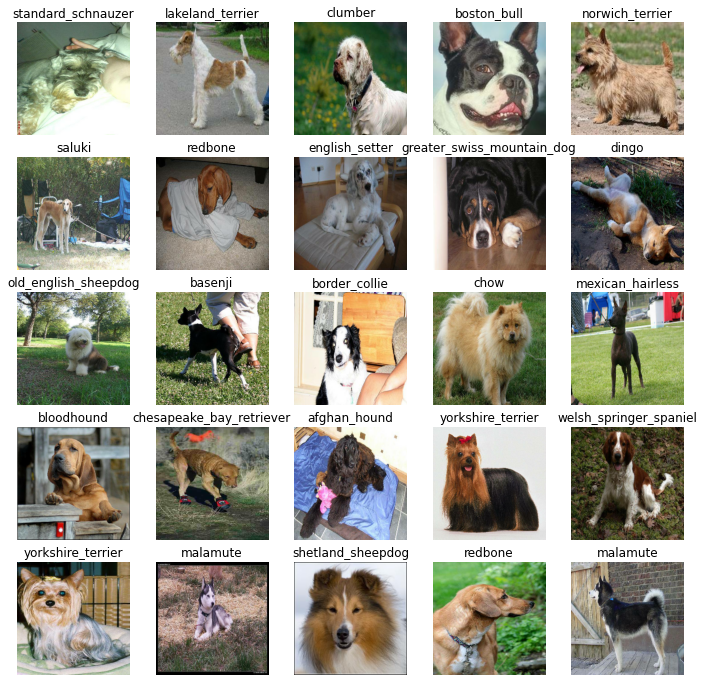

In [240]:
show_25_images(train_images, train_labels)

In [241]:
validation_images, validation_labels =  next(validation_data.as_numpy_iterator())

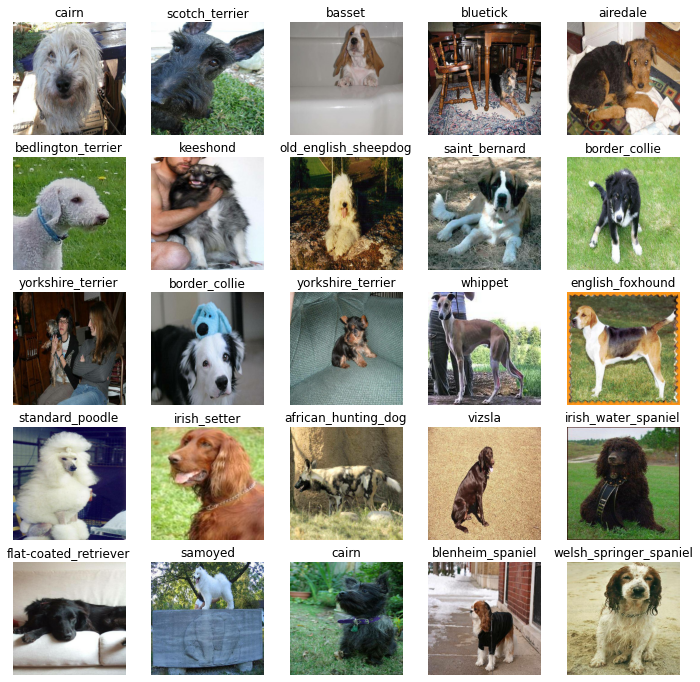

In [242]:
show_25_images(validation_images, validation_labels)

## Creating the model

* The input shape is the image shape (Tensors)
* The output shape is the image labels (Tensors)

In [243]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

resnet_v2_url = "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/5"

In [244]:
# Building Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f"Building model with {model_url}")

  model = tf.keras.Sequential([
                              hub.KerasLayer(MODEL_URL),
                              tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
  ])

  # Compiling model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)

  return model

In [245]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_8 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_8 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Callbacks

Callbacks are functions models use throughout training to check progress. Not only do they evaluate how well a model is training, but it can also stop a model from running if it isn't improving (which saves a lot of time and **prevents overfitting**)

A callback for TensorBoard (checking progress) and for early stopping will be created

In [246]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [247]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("/content/Dog-Breed-Recognition/logs", datetime.datetime.now().strftime("%Y%m%d-%H-%M-%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

In [248]:
early_stopping_val_accuracy = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)
early_stopping_val_loss = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=3)

## Training the model

Initially the model will only be trained on 1000 images. This is to check if it's working,

In [249]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [250]:
if tf.config.list_physical_devices("GPU"):
  print("GPU working")
else:
  print("GPU not working")

GPU working


In [251]:
# Training model
def train_model(early_stopping_callback=early_stopping_val_accuracy, url=MODEL_URL):
  np.random.seed(42)
  model = create_model(model_url=url)
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=validation_data, validation_freq=1, callbacks=[tensorboard, early_stopping_callback])
  return model

In [252]:
model = train_model(early_stopping_callback=early_stopping_val_accuracy)

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 6s 106ms/step - loss: 4.6237 - accuracy: 0.0938 - val_loss: 3.4375 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 2s 95ms/step - loss: 1.6639 - accuracy: 0.6538 - val_loss: 2.1712 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 2s 88ms/step - loss: 0.5722 - accuracy: 0.9413 - val_loss: 1.6815 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 2s 87ms/step - loss: 0.2522 - accuracy: 0.9837 - val_loss: 1.5109 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 2s 88ms/step - loss: 0.1469 - accuracy: 0.9975 - val_loss: 1.4360 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 2s 87ms/step - loss: 0.1001 - accuracy: 1.0000 - val_loss: 1.3799 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 2s

In [253]:
model.evaluate(validation_data)

7/7 [==============================] - 1s 65ms/step - loss: 1.2503 - accuracy: 0.6650


[1.250311255455017, 0.6650000214576721]

In [39]:
# Train on validation accuracy
# np.random.seed(42)
# model_2 = train_model(early_stopping_callback=early_stopping_val_accuracy, url=resnet_v2_url)

In [40]:
# model_2.evaluate(validation_data)

In [41]:
# # Train on validation accuracy
# np.random.seed(42)
# model_3 = train_model(early_stopping_callback=early_stopping_val_accuracy, url="https://tfhub.dev/google/imagenet/inception_v3/classification/5")

In [42]:
# model_3.evaluate(validation_data)

In [254]:
# Shows that current model is overfitting

%tensorboard --logdir /content/Dog-Breed-Recognition/logs

<IPython.core.display.Javascript object>

In [255]:
# Making predictions with the model

# Get predictions on validation set
preds = model.predict(validation_data, verbose=1)
preds

7/7 [==============================] - 6s 82ms/step


array([[6.1662175e-04, 1.6641960e-04, 1.1499069e-03, ..., 3.6819975e-04,
        4.0901246e-05, 3.9721904e-03],
       [2.7349775e-04, 9.9257966e-05, 1.1633276e-03, ..., 7.8517018e-04,
        4.5871083e-04, 3.3123164e-05],
       [1.7262369e-06, 1.1807571e-05, 3.7283680e-05, ..., 7.0464621e-06,
        1.1646705e-05, 2.0522301e-04],
       ...,
       [7.6268566e-07, 2.9472261e-05, 1.4777310e-04, ..., 1.5116256e-05,
        6.8055175e-05, 3.1267857e-05],
       [6.2423502e-04, 1.5214177e-04, 1.4424854e-04, ..., 7.6518474e-05,
        4.5791123e-05, 1.3126447e-03],
       [2.1503484e-04, 3.8355924e-05, 4.4329444e-04, ..., 3.5803806e-02,
        1.2867207e-03, 1.8830842e-04]], dtype=float32)

In [256]:
preds.shape

(200, 120)

In [257]:
len(y_validation)

200

In [258]:
# Each individual preds shows the model's predicted probability of a dog being a certain breed
preds[0], np.sum(preds[0])

(array([6.16621750e-04, 1.66419602e-04, 1.14990689e-03, 9.12681207e-05,
        1.66511221e-04, 1.30024873e-05, 2.02643313e-02, 2.40953697e-04,
        2.46344949e-04, 7.78439164e-04, 9.37751756e-05, 1.34025322e-05,
        3.50403046e-04, 5.21619004e-05, 9.16265562e-05, 1.04503677e-04,
        2.84427861e-05, 5.84640980e-01, 1.60924901e-05, 2.00265476e-05,
        7.62781638e-05, 1.03566104e-04, 9.32199782e-06, 2.70980760e-04,
        1.21153171e-05, 5.71617566e-04, 8.01013857e-02, 5.72567405e-05,
        7.53903645e-04, 5.56220068e-04, 2.36496126e-04, 5.38077671e-04,
        3.53096402e-04, 2.42604256e-05, 3.81846330e-05, 9.63553786e-03,
        1.40750726e-05, 1.78061295e-04, 9.13578115e-05, 1.58470484e-05,
        5.18345390e-04, 7.89038677e-06, 1.62540164e-04, 3.31700649e-05,
        9.11526422e-06, 1.85114375e-04, 1.79542512e-05, 5.35126674e-05,
        3.37266101e-04, 1.41075661e-05, 4.92271429e-05, 6.67089625e-05,
        7.22431651e-05, 3.69734043e-05, 2.53592807e-05, 8.353305

In [259]:
# First prediction (not going to be good)
index = 0
print(f"Max value (probability of prediction): {np.max(preds[index])}")
print(f"Sum: {np.sum(preds[index])}")
print(f"Max index: {np.argmax(preds[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(preds[index])]}")

Max value (probability of prediction): 0.5846409797668457
Sum: 1.0
Max index: 17
Predicted label: border_terrier


In [260]:
unique_breeds[0]

'affenpinscher'

In [261]:
# Assigning probabilities to dog breeds

def get_pred_breed(prediciton_probs):
  return unique_breeds[np.argmax(prediciton_probs)]

pred_breed = get_pred_breed(preds[0])
pred_breed

'border_terrier'

In [262]:
def unbatch_data(data):
  images_unbatched = []
  labels_unbatched = []

  for image, label in validation_data.unbatch().as_numpy_iterator():
    images_unbatched.append(image)
    labels_unbatched.append(unique_breeds[np.argmax(label)])
  
  return images_unbatched, labels_unbatched

In [263]:
validation_images_unbatched, validation_labels_unbatched = unbatch_data(validation_data)
validation_images_unbatched[0], validation_labels_unbatched[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [264]:
get_pred_breed(validation_labels_unbatched[0])

'affenpinscher'

## Visualizing predictions and actual values

In [265]:
def plot_pred(prediction_probs, labels, images, n=1):
  pred_prob, true_label, image = prediction_probs[n], labels[n], images[n]

  pred_label = get_pred_breed(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color="green"
  else:
    color="red"
  plt.title((f"Prediction: {pred_label} ({np.max(pred_prob)*100:2.0f}% confidence). Actual breed: {true_label}"), color=color)

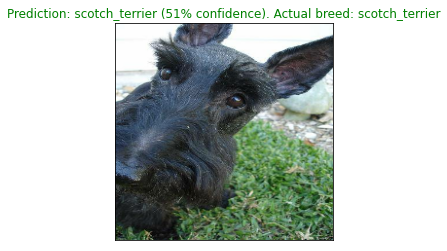

In [266]:
plot_pred(prediction_probs=preds, labels=validation_labels_unbatched, images=validation_images_unbatched)

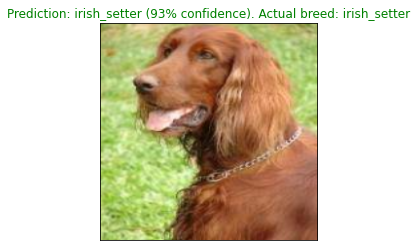

In [267]:
plot_pred(prediction_probs=preds, labels=validation_labels_unbatched, images=validation_images_unbatched, n=16)

In [268]:
def plot_pred_confidence(prediction_probs, labels, n=1):
  """
  Plots the 10 most confident predictions
  """

  pred_prob, true_label = prediction_probs[n], labels[n]

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="red")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    plot[np.argmax(top_10_pred_labels == true_label)].set_color("red")


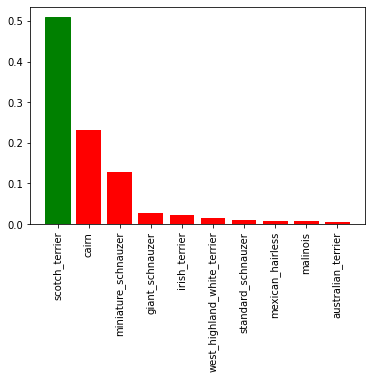

In [269]:
plot_pred_confidence(prediction_probs=preds, labels=validation_labels_unbatched)

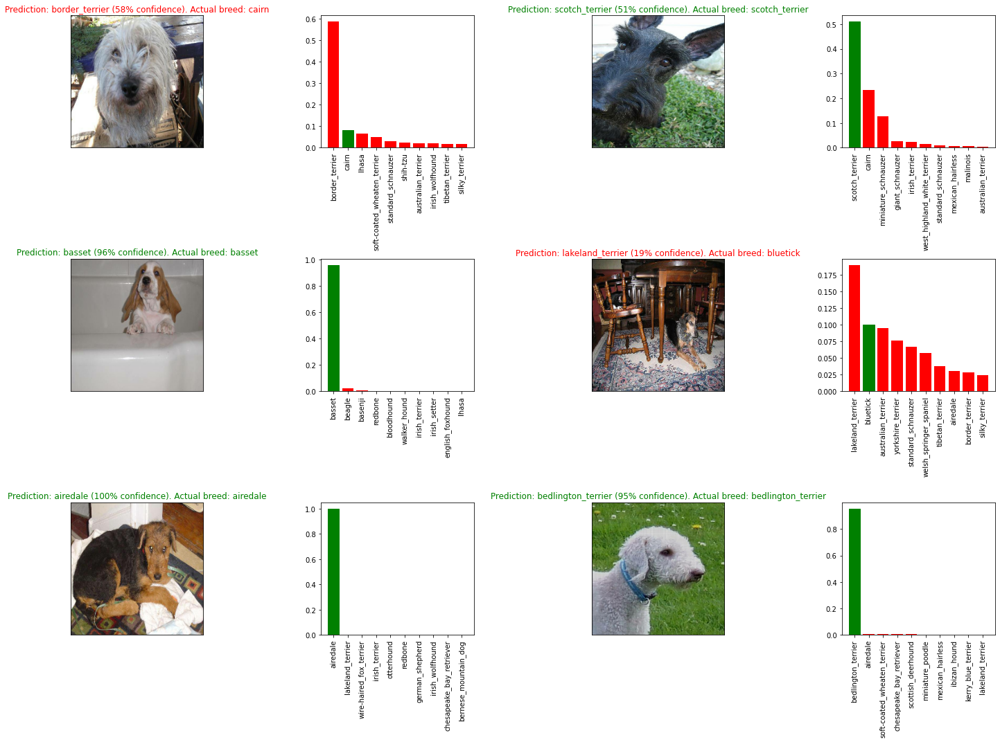

In [270]:
# Viewing predictions and their values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probs=preds,
            labels=validation_labels_unbatched,
            images=validation_images_unbatched,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_confidence(prediction_probs=preds,
                labels=validation_labels_unbatched,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [160]:
# Saving the current model

def save_model(model, suffix=None):
  model_directory = os.path.join("/content/Dog-Breed-Recognition/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = model_directory + '-' + suffix + '.h5'
  model.save(model_path)

  return model_path

In [161]:
def load_model(model_path):
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [62]:
# Save the model trained on 1000 images
# save_model(model, suffix="1000-images-mobilenetv2-Adam")

In [162]:
loaded_1000_image_model = load_model("/content/Dog-Breed-Recognition/models/20220715-07281657870122-1000-images-mobilenetv2-Adam.h5")

In [163]:
model.evaluate(validation_data)

7/7 [==============================] - 1s 65ms/step - loss: 1.2672 - accuracy: 0.6750


[1.2672159671783447, 0.675000011920929]

In [164]:
# This loaded model was from a previous run, better accuracy and loss
loaded_1000_image_model.evaluate(validation_data)

7/7 [==============================] - 1s 60ms/step - loss: 1.2422 - accuracy: 0.7050


[1.2422206401824951, 0.7049999833106995]

7/7 [==============================] - 1s 104ms/step


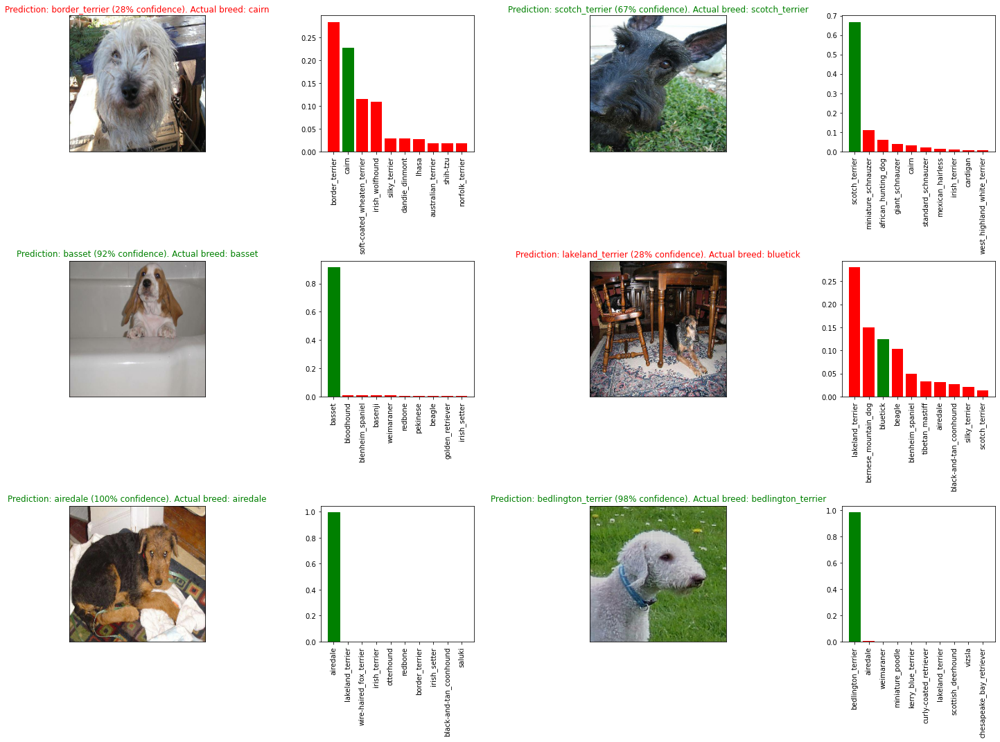

In [165]:
# Viewing saved model predictions and values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

loaded_1000_model_preds = loaded_1000_image_model.predict(validation_data, verbose=1)

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probs=loaded_1000_model_preds,
            labels=validation_labels_unbatched,
            images=validation_images_unbatched,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_confidence(prediction_probs=loaded_1000_model_preds,
                labels=validation_labels_unbatched,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Training on all data

In [166]:
# Creating data batches with data set
full_data = create_batch(X, y)

Training Data


In [167]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [168]:
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [169]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping_accuracy = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)
full_model_early_stopping_loss = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=3)

In [71]:
# Fitting model for accuracy
# full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping_accuracy])

In [72]:
# save_model(full_model, suffix="full-image-set-accuracy-mobilenetv2-Adam")

In [73]:
# Fitting model for loss (what the competition evaluates participants on)
#  full_model_loss = create_model()
#  full_model_loss.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping_loss])

In [74]:
# Fitting model with ResNet

# full_model_resnet = create_model(model_url=resnet_v2_url)
# full_model_resnet.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping_accuracy])

In [75]:
# save_model(full_model_resnet, suffix="full-image-set-accuracy-resnetv2")

In [170]:
loaded_full_accuracy_resnet = load_model("/content/Dog-Breed-Recognition/models/20220717-08231658046232-full-image-set-accuracy-resnetv2.h5")
loaded_full_accuracy_resnet.evaluate(full_data)

320/320 [==============================] - 22s 68ms/step - loss: 0.0113 - accuracy: 0.9993


[0.01128327939659357, 0.9993152022361755]

In [77]:
# save_model(full_model_loss, suffix="full-image-set-loss-mobilenetv2-Adam")

In [171]:
loaded_full_loss_model = load_model("/content/Dog-Breed-Recognition/models/20220716-08041657958667-full-image-set-loss-mobilenetv2-Adam.h5")
loaded_full_loss_model.evaluate(full_data)

320/320 [==============================] - 23s 70ms/step - loss: 0.0140 - accuracy: 0.9984


[0.013986460864543915, 0.9984347224235535]

In [172]:
loaded_full_accuracy_model = load_model("/content/Dog-Breed-Recognition/models/20220716-07431657957390-full-image-set-accuracy-mobilenetv2-Adam.h5")
loaded_full_accuracy_model.evaluate(full_data)

320/320 [==============================] - 23s 70ms/step - loss: 0.0116 - accuracy: 0.9990


[0.011600549332797527, 0.9990217089653015]

In [173]:
loaded_loss_model2 = load_model("/content/Dog-Breed-Recognition/models/20220716-20291658003342-full-image-set-loss-second-mobilenetv2-Adam.h5")
loaded_loss_model2.evaluate(full_data)

320/320 [==============================] - 23s 70ms/step - loss: 0.0068 - accuracy: 0.9988


[0.006752930581569672, 0.9988260865211487]

# The model trained for accuracy has better loss and accuracy compared to original loss trained model. 
# The second loss trained model (same as the original but trained on a newly shuffled dataset) has better loss but worse accuracy. 
# Resnet does have a better loss and accuracy on the training data compared to the accuracy model, but the accuracy model actually had a lower log loss on the test data.

In [81]:
# Making predictions on the test dataset
test_path = "/content/Dog-Breed-Recognition/test/"
test_pathnames = [test_path + fname for fname in os.listdir(test_path)]
test_pathnames[:15]

['/content/Dog-Breed-Recognition/test/5e60bd302fa1c348031aeef1b95a5f6f.jpg',
 '/content/Dog-Breed-Recognition/test/4fd4564ec712591906835e0ebed1987c.jpg',
 '/content/Dog-Breed-Recognition/test/21d9417da917b9081a42d426edfffdbb.jpg',
 '/content/Dog-Breed-Recognition/test/35737c35498665353f4566ee9e30adb6.jpg',
 '/content/Dog-Breed-Recognition/test/7632300f2614bb34b5f167224c2bb680.jpg',
 '/content/Dog-Breed-Recognition/test/0d0964db201a2c0765bde74ca28148ef.jpg',
 '/content/Dog-Breed-Recognition/test/07b9276c1a3b39979d0f75027fb10dc6.jpg',
 '/content/Dog-Breed-Recognition/test/95040802b4e1029a9e000b3664bbf6ee.jpg',
 '/content/Dog-Breed-Recognition/test/5dc9fcab9438b00d5b27f7ffd30dc218.jpg',
 '/content/Dog-Breed-Recognition/test/deaf748bed865ec76758f086db04bfac.jpg',
 '/content/Dog-Breed-Recognition/test/15843a88e6981a66185a2a6c85a6168d.jpg',
 '/content/Dog-Breed-Recognition/test/ba2e4f5524afd4383ef430a998e6ad54.jpg',
 '/content/Dog-Breed-Recognition/test/810a8bc224dc72a23a9242339756444d.jpg',

In [82]:
# Converting to Tensor batches
test_data = create_batch(X=test_pathnames, test=True)

Test Data


In [83]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [84]:
# Making predictions with model trained on accuracy
test_preds = loaded_full_accuracy_model.predict(test_data, verbose=1)

324/324 [==============================] - 26s 79ms/step


In [85]:
test_preds

array([[2.0021274e-08, 1.6886674e-11, 2.2879671e-08, ..., 2.7833060e-09,
        7.3405870e-10, 4.8950156e-11],
       [5.6319982e-10, 4.4631324e-08, 2.2953704e-07, ..., 1.3614564e-06,
        7.8165634e-08, 5.8643292e-11],
       [2.1280622e-09, 2.3439179e-07, 1.6652695e-07, ..., 2.8301518e-08,
        8.8619436e-06, 4.8415902e-08],
       ...,
       [4.1597835e-14, 5.4216021e-11, 9.3961270e-14, ..., 7.9495726e-07,
        1.4878862e-10, 1.1945911e-09],
       [9.7547755e-08, 6.4078500e-07, 9.2187491e-10, ..., 1.8622288e-08,
        3.6863642e-07, 3.4133229e-06],
       [9.9435389e-01, 2.5304031e-10, 2.1463663e-10, ..., 9.5372765e-11,
        3.9997087e-08, 3.7897926e-06]], dtype=float32)

In [86]:
# Saving accuracy predicitons
# np.savetxt("/content/Dog-Breed-Recognition/test_preds_accuracy.csv", test_preds, delimiter=",")
test_preds_accuracy = np.loadtxt("/content/Dog-Breed-Recognition/test_preds_accuracy.csv", delimiter=",")
test_preds_accuracy

array([[1.07843603e-04, 1.05002451e-10, 3.15463922e-08, ...,
        3.12187944e-06, 1.26434010e-04, 3.30999910e-06],
       [7.85743920e-13, 8.77387486e-12, 2.76854373e-11, ...,
        5.54839126e-11, 2.03287109e-11, 3.85175863e-10],
       [4.38125591e-10, 3.56221233e-11, 2.03103539e-07, ...,
        5.26031496e-10, 2.79232991e-11, 1.67356938e-12],
       ...,
       [6.39706850e-05, 6.05063222e-10, 4.50223645e-08, ...,
        7.77326434e-08, 2.46553007e-03, 1.09305769e-01],
       [2.37045973e-12, 2.50866466e-13, 1.94160971e-13, ...,
        2.09030102e-11, 3.64029451e-14, 5.45423285e-14],
       [5.29468616e-06, 1.39344332e-08, 1.86500785e-07, ...,
        3.03690205e-04, 7.62068885e-05, 4.59119285e-08]])

In [87]:
# Making predicitons with 1st loss model
test_preds_loss1 = loaded_full_loss_model.predict(test_data, verbose=1)

324/324 [==============================] - 24s 74ms/step


In [88]:
test_preds_loss1

array([[3.8430645e-09, 1.8973211e-12, 4.9284976e-09, ..., 9.3325758e-10,
        5.6140408e-11, 1.1751945e-11],
       [7.6334973e-11, 7.1513182e-09, 5.9607423e-08, ..., 7.4967225e-08,
        2.5629792e-08, 1.6287411e-11],
       [9.2264724e-10, 8.0209695e-08, 8.8798274e-08, ..., 3.7517296e-09,
        8.5149495e-06, 2.6620153e-08],
       ...,
       [3.6495228e-15, 5.0642888e-12, 1.1975549e-14, ..., 6.8661751e-07,
        2.3636060e-11, 3.4854181e-10],
       [7.6656086e-09, 1.0984358e-07, 7.9832273e-11, ..., 4.4503431e-10,
        8.4035470e-08, 4.1245531e-07],
       [9.9550760e-01, 5.8811719e-11, 5.0816112e-11, ..., 3.1129994e-11,
        1.5336214e-08, 7.3285833e-07]], dtype=float32)

In [89]:
# Saving first loss model predictions
# np.savetxt("/content/Dog-Breed-Recognition/test_preds_loss1.csv", test_preds_loss1, delimiter=",")
test_preds_loss1_csv = np.loadtxt("/content/Dog-Breed-Recognition/test_preds_loss1.csv", delimiter=",")
test_preds_loss1_csv

array([[6.60216101e-05, 1.39181314e-11, 1.13299770e-08, ...,
        2.27446230e-06, 2.77079853e-05, 5.81407448e-07],
       [6.92072606e-14, 8.98262313e-13, 4.05336919e-12, ...,
        6.94991417e-12, 1.92872909e-12, 7.20642712e-11],
       [1.06391250e-10, 8.40348451e-12, 7.12143731e-08, ...,
        3.23124416e-10, 3.85778562e-12, 1.87076171e-13],
       ...,
       [1.90378960e-05, 7.17863338e-11, 1.08996394e-08, ...,
        7.08990733e-09, 7.42109900e-04, 3.92687544e-02],
       [2.36081093e-13, 1.56534535e-14, 1.60081671e-14, ...,
        6.94515539e-12, 1.52808333e-15, 7.45683930e-15],
       [1.58478190e-06, 2.42448017e-09, 4.98926056e-08, ...,
        8.17036344e-05, 1.30113258e-05, 7.30021910e-09]])

In [90]:
# Making predictions with 2nd loss model
test_preds_loss2 = loaded_loss_model2.predict(test_data, verbose=1)

324/324 [==============================] - 29s 87ms/step


In [91]:
test_preds_loss2

array([[2.7528757e-09, 3.4203201e-14, 1.6655741e-10, ..., 1.3241851e-11,
        5.8365613e-12, 8.2325509e-12],
       [1.2927036e-11, 4.8913447e-09, 3.4095631e-08, ..., 2.0911946e-06,
        5.1155862e-09, 2.2203604e-11],
       [4.5130719e-10, 7.4530879e-09, 1.0497857e-08, ..., 2.0644750e-09,
        3.4337443e-06, 4.3386975e-10],
       ...,
       [4.0342336e-17, 2.8696999e-14, 2.5783331e-16, ..., 1.1713949e-08,
        4.3738776e-13, 7.9477961e-12],
       [8.2994923e-11, 4.3003241e-09, 3.2538046e-12, ..., 2.3583547e-11,
        1.7617350e-09, 1.7024565e-08],
       [9.9788386e-01, 5.1733119e-12, 8.0543827e-12, ..., 2.3004472e-12,
        1.2252799e-08, 7.4843918e-08]], dtype=float32)

In [92]:
# Saving second loss model predicitons
# np.savetxt("/content/Dog-Breed-Recognition/test_preds_loss2.csv", test_preds_loss2, delimiter=",")
test_preds_loss2_csv = np.loadtxt("/content/Dog-Breed-Recognition/test_preds_loss2.csv", delimiter=",")
test_preds_loss2_csv

array([[2.29872621e-05, 5.09604902e-12, 1.66648229e-09, ...,
        1.95570692e-06, 1.76709091e-05, 2.69038196e-08],
       [1.73425710e-14, 5.81558862e-14, 2.98586026e-13, ...,
        6.70821092e-13, 1.10193939e-12, 1.48702741e-12],
       [3.72093632e-13, 2.24260280e-13, 7.77163389e-10, ...,
        3.28536867e-13, 1.17446797e-13, 2.63629243e-15],
       ...,
       [4.10274661e-05, 1.97408184e-11, 1.59186513e-08, ...,
        1.44561829e-09, 5.25375712e-04, 3.77142355e-02],
       [8.54351143e-15, 2.40364541e-17, 2.19174473e-16, ...,
        6.88615289e-14, 2.03762196e-17, 3.53093201e-16],
       [1.55046095e-07, 1.51740620e-10, 1.18789556e-09, ...,
        2.60561123e-04, 3.33723729e-05, 1.64983371e-09]])

In [93]:
# Making resnet accuracy model precitions
test_preds_accuracy_resnet = loaded_full_accuracy_resnet.predict(test_data, verbose=1)

324/324 [==============================] - 26s 79ms/step


In [94]:
test_preds_accuracy_resnet

array([[7.6201294e-09, 3.5919449e-12, 1.4165871e-09, ..., 5.5902721e-10,
        1.5265911e-10, 9.6229677e-11],
       [1.5696398e-10, 5.4043898e-08, 1.6848655e-07, ..., 3.6251265e-06,
        2.1312278e-08, 2.4292146e-10],
       [8.9003951e-09, 1.4641819e-07, 2.4742837e-07, ..., 2.4983066e-08,
        4.9516125e-06, 2.9535046e-08],
       ...,
       [6.5571348e-14, 5.3022712e-12, 2.7347726e-13, ..., 1.4235150e-06,
        6.9552322e-11, 9.9493136e-11],
       [2.4586859e-07, 4.7651002e-07, 4.1285211e-09, ..., 3.0155302e-08,
        9.5567987e-07, 2.0810701e-06],
       [9.9533033e-01, 2.4902541e-10, 1.3861943e-09, ..., 3.2649652e-10,
        9.2071296e-08, 2.3973357e-06]], dtype=float32)

In [95]:
np.savetxt("/content/Dog-Breed-Recognition/test_preds_resnet_accuracy.csv", test_preds_accuracy_resnet, delimiter=",")
test_preds_accuracy_resnet_csv = np.loadtxt("/content/Dog-Breed-Recognition/test_preds_resnet_accuracy.csv", delimiter=",")
test_preds_accuracy_resnet_csv

array([[7.62012942e-09, 3.59194488e-12, 1.41658707e-09, ...,
        5.59027213e-10, 1.52659108e-10, 9.62296770e-11],
       [1.56963983e-10, 5.40438982e-08, 1.68486551e-07, ...,
        3.62512651e-06, 2.13122782e-08, 2.42921461e-10],
       [8.90039509e-09, 1.46418188e-07, 2.47428375e-07, ...,
        2.49830663e-08, 4.95161248e-06, 2.95350464e-08],
       ...,
       [6.55713480e-14, 5.30227121e-12, 2.73477259e-13, ...,
        1.42351496e-06, 6.95523222e-11, 9.94931360e-11],
       [2.45868591e-07, 4.76510024e-07, 4.12852108e-09, ...,
        3.01553023e-08, 9.55679866e-07, 2.08107008e-06],
       [9.95330334e-01, 2.49025411e-10, 1.38619427e-09, ...,
        3.26496524e-10, 9.20712964e-08, 2.39733572e-06]])

In [96]:
# Adding labels to files
# Accuracy df
preds_accuracy_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_accuracy_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [97]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_accuracy_df["id"] = test_ids

In [98]:
# Adding prediction probabilities
preds_accuracy_df[list(unique_breeds)] = test_preds_accuracy
preds_accuracy_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,5e60bd302fa1c348031aeef1b95a5f6f,1.078436e-04,1.050025e-10,3.154639e-08,3.197404e-09,2.380288e-01,9.074289e-10,2.123406e-07,1.945100e-06,4.476265e-07,...,7.901817e-06,2.603085e-02,5.179530e-08,5.815632e-08,3.149541e-08,2.076489e-08,2.039752e-05,3.121879e-06,1.264340e-04,3.309999e-06
1,4fd4564ec712591906835e0ebed1987c,7.857439e-13,8.773875e-12,2.768544e-11,1.564597e-10,1.378743e-07,3.832968e-10,3.661224e-11,1.648400e-10,7.459224e-09,...,1.638737e-08,7.779723e-11,3.743045e-06,6.826207e-09,9.999688e-01,5.009046e-11,2.715003e-09,5.548391e-11,2.032871e-11,3.851759e-10
2,21d9417da917b9081a42d426edfffdbb,4.381256e-10,3.562212e-11,2.031035e-07,1.223465e-10,2.150252e-11,9.718957e-11,1.974847e-10,4.773732e-09,1.602409e-07,...,3.967808e-11,1.527974e-10,9.123843e-12,5.561503e-10,8.051901e-12,2.600088e-07,2.065890e-11,5.260315e-10,2.792330e-11,1.673569e-12
3,35737c35498665353f4566ee9e30adb6,2.397340e-08,3.009041e-10,6.049402e-09,7.888087e-09,4.158264e-11,1.418531e-08,2.052242e-10,1.598060e-12,1.644940e-12,...,1.163092e-11,4.650774e-12,1.850489e-09,8.446889e-10,9.930744e-09,4.033204e-11,1.356030e-10,1.261255e-10,2.164145e-11,7.039290e-10
4,7632300f2614bb34b5f167224c2bb680,6.267202e-09,3.233964e-06,4.759747e-10,2.336603e-04,2.780900e-09,4.894730e-08,9.741716e-06,1.900675e-09,1.063465e-08,...,1.643442e-07,2.949432e-09,2.902883e-05,7.725530e-06,5.747986e-08,9.766490e-04,5.804564e-10,8.189063e-09,1.979401e-08,7.284247e-07


In [99]:
test_preds_accuracy

array([[1.07843603e-04, 1.05002451e-10, 3.15463922e-08, ...,
        3.12187944e-06, 1.26434010e-04, 3.30999910e-06],
       [7.85743920e-13, 8.77387486e-12, 2.76854373e-11, ...,
        5.54839126e-11, 2.03287109e-11, 3.85175863e-10],
       [4.38125591e-10, 3.56221233e-11, 2.03103539e-07, ...,
        5.26031496e-10, 2.79232991e-11, 1.67356938e-12],
       ...,
       [6.39706850e-05, 6.05063222e-10, 4.50223645e-08, ...,
        7.77326434e-08, 2.46553007e-03, 1.09305769e-01],
       [2.37045973e-12, 2.50866466e-13, 1.94160971e-13, ...,
        2.09030102e-11, 3.64029451e-14, 5.45423285e-14],
       [5.29468616e-06, 1.39344332e-08, 1.86500785e-07, ...,
        3.03690205e-04, 7.62068885e-05, 4.59119285e-08]])

In [100]:
# preds_accuracy_df.to_csv("/content/Dog-Breed-Recognition/full-model-accuracy-submission.csv", index=False)

In [101]:
# from google.colab import files
# files.download("/content/Dog-Breed-Recognition/full-model-accuracy-submission.csv")

In [102]:
# First loss dataset
preds_loss_df1 = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_loss_df1["id"] = test_ids
preds_loss_df1[list(unique_breeds)] = test_preds_loss1
preds_loss_df1.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,5e60bd302fa1c348031aeef1b95a5f6f,3.843065e-09,1.897321e-12,4.928498e-09,2.949587e-10,6.383913e-09,5.459583e-10,5.642297e-14,1.142369e-11,8.982628e-12,...,4.028538e-11,1.420186e-11,3.936781e-06,1.363595e-08,3.514549e-08,1.044138e-10,2.452088e-11,9.332576e-10,5.614041e-11,1.175194e-11
1,4fd4564ec712591906835e0ebed1987c,7.633497e-11,7.151318e-09,5.960742e-08,1.316925e-06,7.726599e-08,1.590269e-06,3.370308e-09,6.967956e-10,3.873252e-11,...,3.016223e-10,1.835800e-14,2.929247e-09,1.302048e-06,8.885973e-11,4.286611e-08,3.989744e-11,7.496723e-08,2.562979e-08,1.628741e-11
2,21d9417da917b9081a42d426edfffdbb,9.226472e-10,8.020969e-08,8.879827e-08,2.515284e-08,6.432771e-07,2.214820e-08,4.121421e-08,7.089768e-07,4.263732e-09,...,9.184602e-09,9.863284e-09,1.009056e-08,9.704810e-08,5.203143e-08,7.180769e-08,4.404498e-10,3.751730e-09,8.514950e-06,2.662015e-08
3,35737c35498665353f4566ee9e30adb6,4.052500e-11,1.517619e-11,2.906647e-13,9.212277e-11,3.529445e-11,2.379989e-11,2.468526e-08,7.727836e-10,1.707551e-12,...,6.088442e-08,2.103463e-12,9.473195e-15,9.631503e-11,6.221027e-13,4.793346e-10,1.219807e-11,2.687072e-16,1.405828e-13,3.522743e-13
4,7632300f2614bb34b5f167224c2bb680,3.270495e-10,2.197581e-12,1.616557e-07,3.544160e-11,2.355352e-11,3.756080e-12,5.031533e-08,1.277760e-05,7.840956e-08,...,2.637015e-06,5.742497e-03,1.094798e-07,6.929886e-14,9.232516e-10,6.301908e-09,4.642470e-11,1.392679e-06,1.216787e-10,1.733056e-09


In [103]:
test_preds_loss1_csv

array([[6.60216101e-05, 1.39181314e-11, 1.13299770e-08, ...,
        2.27446230e-06, 2.77079853e-05, 5.81407448e-07],
       [6.92072606e-14, 8.98262313e-13, 4.05336919e-12, ...,
        6.94991417e-12, 1.92872909e-12, 7.20642712e-11],
       [1.06391250e-10, 8.40348451e-12, 7.12143731e-08, ...,
        3.23124416e-10, 3.85778562e-12, 1.87076171e-13],
       ...,
       [1.90378960e-05, 7.17863338e-11, 1.08996394e-08, ...,
        7.08990733e-09, 7.42109900e-04, 3.92687544e-02],
       [2.36081093e-13, 1.56534535e-14, 1.60081671e-14, ...,
        6.94515539e-12, 1.52808333e-15, 7.45683930e-15],
       [1.58478190e-06, 2.42448017e-09, 4.98926056e-08, ...,
        8.17036344e-05, 1.30113258e-05, 7.30021910e-09]])

In [104]:
# preds_loss_df1.to_csv("/content/Dog-Breed-Recognition/full-model-loss-1-submission.csv", index=False)

In [105]:
# from google.colab import files
# files.download("/content/Dog-Breed-Recognition/full-model-loss-1-submission.csv")

In [106]:
# Second loss dataset
preds_loss_df2 = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_loss_df2["id"] = test_ids
preds_loss_df2[list(unique_breeds)] = test_preds_loss2
preds_loss_df2.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,5e60bd302fa1c348031aeef1b95a5f6f,2.752876e-09,3.420320e-14,1.665574e-10,6.527771e-11,6.826942e-11,6.939174e-11,1.052652e-14,6.907312e-14,3.929520e-13,...,9.541769e-12,2.473420e-13,1.949987e-06,2.883911e-09,1.401087e-09,1.514622e-12,9.141706e-13,1.324185e-11,5.836561e-12,8.232551e-12
1,4fd4564ec712591906835e0ebed1987c,1.292704e-11,4.891345e-09,3.409563e-08,6.704611e-06,1.482408e-08,1.359441e-06,8.746817e-09,1.040282e-09,1.287780e-10,...,9.531440e-11,1.493944e-15,3.279116e-10,7.370016e-08,5.590551e-11,5.449513e-09,8.108761e-13,2.091195e-06,5.115586e-09,2.220360e-11
2,21d9417da917b9081a42d426edfffdbb,4.513072e-10,7.453088e-09,1.049786e-08,2.651394e-09,1.663642e-07,1.498683e-09,3.996273e-09,1.174123e-07,1.865431e-10,...,2.782913e-09,1.312453e-09,1.616030e-09,2.935455e-08,2.413847e-08,5.787976e-09,7.815083e-11,2.064475e-09,3.433744e-06,4.338697e-10
3,35737c35498665353f4566ee9e30adb6,1.176340e-11,3.381911e-12,1.647906e-13,5.781880e-11,2.641993e-11,1.665096e-11,2.030943e-08,3.593328e-10,6.047034e-13,...,3.496728e-08,5.538453e-13,6.777579e-16,9.592511e-12,2.846746e-13,1.380614e-10,7.538990e-12,2.006721e-17,1.309010e-13,4.883649e-14
4,7632300f2614bb34b5f167224c2bb680,5.930205e-12,9.085590e-14,3.061693e-08,3.005838e-12,1.347948e-11,3.232742e-13,1.118516e-08,2.050507e-06,3.667772e-08,...,7.002971e-07,1.641160e-03,1.812457e-09,4.545078e-15,3.087575e-10,7.902933e-10,1.563344e-10,1.257835e-08,1.923690e-10,1.704159e-10


In [107]:
test_preds_loss2_csv

array([[2.29872621e-05, 5.09604902e-12, 1.66648229e-09, ...,
        1.95570692e-06, 1.76709091e-05, 2.69038196e-08],
       [1.73425710e-14, 5.81558862e-14, 2.98586026e-13, ...,
        6.70821092e-13, 1.10193939e-12, 1.48702741e-12],
       [3.72093632e-13, 2.24260280e-13, 7.77163389e-10, ...,
        3.28536867e-13, 1.17446797e-13, 2.63629243e-15],
       ...,
       [4.10274661e-05, 1.97408184e-11, 1.59186513e-08, ...,
        1.44561829e-09, 5.25375712e-04, 3.77142355e-02],
       [8.54351143e-15, 2.40364541e-17, 2.19174473e-16, ...,
        6.88615289e-14, 2.03762196e-17, 3.53093201e-16],
       [1.55046095e-07, 1.51740620e-10, 1.18789556e-09, ...,
        2.60561123e-04, 3.33723729e-05, 1.64983371e-09]])

In [108]:
# preds_loss_df2.to_csv("/content/Dog-Breed-Recognition/full-model-loss-2-submission.csv", index=False)

In [109]:
# from google.colab import files
# files.download("/content/Dog-Breed-Recognition/full-model-loss-2-submission.csv")

In [110]:
# Accuracy resnet dataset

resnet_preds_accuracy_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
resnet_preds_accuracy_df["id"] = test_ids
resnet_preds_accuracy_df[list(unique_breeds)] = test_preds_accuracy_resnet
resnet_preds_accuracy_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,5e60bd302fa1c348031aeef1b95a5f6f,7.620129e-09,3.591945e-12,1.416587e-09,5.679595e-10,1.865518e-08,5.702045e-09,2.332575e-13,2.251464e-11,5.871999e-11,...,7.982986e-11,3.504111e-11,1.541904e-05,6.806830e-08,7.697511e-08,5.246790e-10,1.095173e-10,5.590272e-10,1.526591e-10,9.622968e-11
1,4fd4564ec712591906835e0ebed1987c,1.569640e-10,5.404390e-08,1.684866e-07,1.911735e-05,4.026973e-07,3.665701e-06,8.261027e-08,3.759583e-08,4.074917e-10,...,2.999188e-10,3.489727e-13,3.124951e-09,8.541801e-07,5.158336e-10,1.271892e-07,9.635551e-10,3.625127e-06,2.131228e-08,2.429215e-10
2,21d9417da917b9081a42d426edfffdbb,8.900395e-09,1.464182e-07,2.474284e-07,1.710313e-08,1.052318e-06,6.349931e-08,5.819183e-08,4.471270e-07,1.173446e-08,...,1.953734e-08,1.295096e-07,1.499352e-08,7.595221e-08,1.318956e-07,4.086341e-08,2.286791e-09,2.498307e-08,4.951612e-06,2.953505e-08
3,35737c35498665353f4566ee9e30adb6,5.476066e-11,2.271377e-10,3.311930e-12,1.997961e-09,1.323976e-09,1.635194e-10,1.105993e-07,1.687312e-08,4.007291e-12,...,1.999822e-07,1.225108e-11,7.698816e-14,5.666331e-11,2.205154e-11,2.488894e-09,7.209173e-11,1.198382e-14,2.481416e-12,6.829671e-12
4,7632300f2614bb34b5f167224c2bb680,1.395220e-09,5.122357e-12,1.848356e-07,8.312273e-10,5.102382e-10,1.298410e-11,2.403941e-07,3.977928e-05,1.676475e-06,...,6.243330e-06,9.724018e-03,2.031147e-07,1.321362e-12,2.038305e-09,8.993169e-09,7.255530e-10,9.209870e-07,1.072463e-09,7.951761e-09


In [111]:
test_preds_accuracy_resnet_csv

array([[7.62012942e-09, 3.59194488e-12, 1.41658707e-09, ...,
        5.59027213e-10, 1.52659108e-10, 9.62296770e-11],
       [1.56963983e-10, 5.40438982e-08, 1.68486551e-07, ...,
        3.62512651e-06, 2.13122782e-08, 2.42921461e-10],
       [8.90039509e-09, 1.46418188e-07, 2.47428375e-07, ...,
        2.49830663e-08, 4.95161248e-06, 2.95350464e-08],
       ...,
       [6.55713480e-14, 5.30227121e-12, 2.73477259e-13, ...,
        1.42351496e-06, 6.95523222e-11, 9.94931360e-11],
       [2.45868591e-07, 4.76510024e-07, 4.12852108e-09, ...,
        3.01553023e-08, 9.55679866e-07, 2.08107008e-06],
       [9.95330334e-01, 2.49025411e-10, 1.38619427e-09, ...,
        3.26496524e-10, 9.20712964e-08, 2.39733572e-06]])

In [112]:
# resnet_preds_accuracy_df.to_csv("/content/Dog-Breed-Recognition/full-model-resnet-accuracy-submission.csv", index=False)

In [113]:
# from google.colab import files
# files.download("/content/Dog-Breed-Recognition/full-model-resnet-accuracy-submission.csv")

In [114]:
# The original model trained on accuracy ended up performing the best on the test dataset, having the lowest log loss score.

# Predictions on custom images

In [188]:
# I have taken 3 images of random dogs (Shiba Inu, Rottweilier, and German Sheperd) from Google
custom_folder = "/content/Dog-Breed-Recognition/custom/"
custom_file_paths =  [custom_folder + path for path in os.listdir(custom_folder)]

In [189]:
custom_file_paths

['/content/Dog-Breed-Recognition/custom/.ipynb_checkpoints',
 '/content/Dog-Breed-Recognition/custom/German_Shepherd_-_DSC_0346_(10096362833).jpg',
 '/content/Dog-Breed-Recognition/custom/Taka_Shiba.jpg',
 '/content/Dog-Breed-Recognition/custom/shutterstock_219143260.jpg.optimal.jpg']

In [190]:
# Removing the directory
custom_file_paths = custom_file_paths[1:4]
custom_file_paths

['/content/Dog-Breed-Recognition/custom/German_Shepherd_-_DSC_0346_(10096362833).jpg',
 '/content/Dog-Breed-Recognition/custom/Taka_Shiba.jpg',
 '/content/Dog-Breed-Recognition/custom/shutterstock_219143260.jpg.optimal.jpg']

In [191]:
custom_data = create_batch(custom_file_paths, test=True)

Test Data


In [192]:
custom_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [193]:
custom_preds = loaded_full_accuracy_model.predict(custom_data)

In [194]:
# Getting predicted breeds
custom_pred_labels = [get_pred_breed(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'chow', 'rottweiler']

In [213]:
actual_breeds = ["german_shepherd", 'shiba inu', 'rottweiler']

In [207]:
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

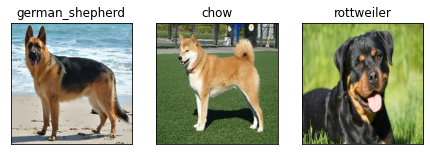

In [208]:
plt.figure(figsize=(10,10))
for index, image in enumerate(custom_images):
  plt.subplot(1,4,index+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[index])
  plt.imshow(image)

In [209]:
# Got rottweiler and german sheperd correctly, but shiba inu incorrectly

In [210]:
def plot_custom_pred(prediction_probs, labels, images, n=1):
  pred_prob, true_label, image = prediction_probs[n], labels[n], images[n]

  pred_label = get_pred_breed(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color="green"
  else:
    color="red"
  plt.title((f"Prediction: {pred_label} ({np.max(pred_prob)*100:2.0f}% confidence). Actual breed: {true_label}"), color=color)

In [211]:
def plot_custom_pred_confidence(prediction_probs, labels, n=1):
  """
  Plots the 10 most confident predictions
  """

  pred_prob, true_label = prediction_probs[n], labels[n]

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="red")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    plot[np.argmax(top_10_pred_labels == true_label)].set_color("red")


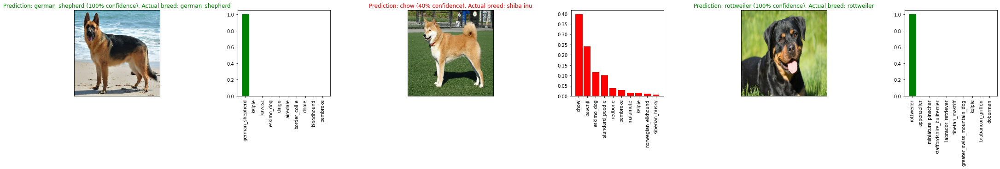

In [214]:
# Viewing predictions and their values
i_multiplier = 0
num_rows = 1
num_cols = 3
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_custom_pred(prediction_probs=custom_preds, labels=actual_breeds,
                   images=custom_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_custom_pred_confidence(prediction_probs=custom_preds,
                labels=actual_breeds,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [202]:
# Turns out none of the images the model was tested on were of shiba inus
# Explains why it got the prediction wrong

for i in unique_breeds:
  if i == "shiba_inu":
    print(i)

# Testing on validation data

Splitting all of the train folder into a training and validation set, and then analyzing the model on it.

In [216]:
X = pathnames
y = encoded_labels
len(X), len(y)

(10222, 10222)

In [217]:
NUM_IMAGES = 10222

In [218]:
from sklearn.model_selection import train_test_split

np.random.seed(42)
X_train, X_validation, y_train, y_validation = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2)

len(X_train), len(y_train), len(X_validation), len(y_validation)

(8177, 8177, 2045, 2045)

In [219]:
train_data = create_batch(X_train, y_train)
validation_data = create_batch(X_validation, y_validation, validation=True)

Training Data
Validation Data


In [220]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [227]:
# Train on validation accuracy (creating a new accuracy model and then testing it)
np.random.seed(42)
model = train_model(early_stopping_callback=early_stopping_val_accuracy)

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
256/256 [==============================] - 25s 86ms/step - loss: 1.4705 - accuracy: 0.6444 - val_loss: 0.6918 - val_accuracy: 0.7995
Epoch 2/100
256/256 [==============================] - 30s 116ms/step - loss: 0.4102 - accuracy: 0.8832 - val_loss: 0.6383 - val_accuracy: 0.8147
Epoch 3/100
256/256 [==============================] - 23s 89ms/step - loss: 0.2363 - accuracy: 0.9401 - val_loss: 0.6326 - val_accuracy: 0.8098
Epoch 4/100
256/256 [==============================] - 23s 89ms/step - loss: 0.1505 - accuracy: 0.9671 - val_loss: 0.6216 - val_accuracy: 0.8210
Epoch 5/100
256/256 [==============================] - 22s 86ms/step - loss: 0.1011 - accuracy: 0.9832 - val_loss: 0.6559 - val_accuracy: 0.8064
Epoch 6/100
256/256 [==============================] - 23s 88ms/step - loss: 0.0741 - accuracy: 0.9890 - val_loss: 0.6626 - val_accuracy: 0.8127
Epoch 7/100
256/256 [================

In [228]:
model.evaluate(validation_data)

64/64 [==============================] - 5s 71ms/step - loss: 0.6775 - accuracy: 0.8117


[0.6775309443473816, 0.8117359280586243]

In [ ]:
# As seen from the results, the model overfits on the train data, however, is still quite accurate (~80%) on the validation data
# On almost every epoch the accuracy stays around 80%
# This suggests that training the data more won't improve much